# Введение
Закон о раскрытии информации по жилищной ипотеке (HMDA) требует от многих финансовых учреждений хранить, сообщать и публично раскрывать информацию об ипотеке. Этот набор данных охватывает все решения по ипотеке, принятые в 2015 году в штате Нью-Йорк.

Прежде чем мы углубимся в решение проблемы, давайте сначала разберемся в теме, связанной с этим набором данных. Лучший способ — зайти на сайт [HMDA](https://www.consumerfinance.gov/data-research/hmda/) и получить информацию.

### Интересующие вопросы

1. Где вероятнее всего одобрят ипотеку?
2. Можете ли вы предсказать решения по ипотеке на основе признаков, представленных в датасете?

# Решение

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
cd 'drive/MyDrive/ШИФТ. Зима 2024. Классический ML/Baseline'

/content/drive/MyDrive/ШИФТ. Зима 2024. Классический ML/Baseline


In [3]:
ls

Baseline.ipynb  submission.csv  test.csv  train.csv


## Разведочный анализ данных (EDA)

### **[Pandas](https://pandas.pydata.org/docs/user_guide/index.html#user-guide)**

In [1]:
import pandas as pd

In [2]:
SEED = 42  # фиксируем значение ГПСЧ для воспроизводимости результатов

In [4]:
%%time
# %%time в начале ячейки позволит узнать, как долго исполнялся код

# чтение датасета
df_train = pd.read_csv('train.csv', index_col=0)
df_train.head()

<timed exec>:4: DtypeWarning: Columns (16,17,18,33,34,35) have mixed types. Specify dtype option on import or set low_memory=False.


CPU times: total: 2.98 s
Wall time: 2.96 s


,action_taken,action_taken_name,agency_code,agency_abbr,agency_name,applicant_ethnicity,applicant_ethnicity_name,applicant_income_000s,applicant_race_1,applicant_race_2,...,state_name,hud_median_family_income,loan_amount_000s,number_of_1_to_4_family_units,number_of_owner_occupied_units,minority_population,population,rate_spread,tract_to_msamd_income,target
0,6,Loan purchased by the institution,9,CFPB,Consumer Financial Protection Bureau,4,Not applicable,NaN,7,NaN,...,New York,69000.0,181,967.0,827.0,5.070000,3077.0,NaN,160.740005,False
1,4,Application withdrawn by applicant,7,HUD,Department of Housing and Urban Development,2,Not Hispanic or Latino,225.0,5,NaN,...,New York,71300.0,210,955.0,533.0,31.570000,2357.0,NaN,174.000000,False
2,6,Loan purchased by the institution,9,CFPB,Consumer Financial Protection Bureau,4,Not applicable,NaN,7,NaN,...,New York,57200.0,11,1667.0,493.0,17.639999,4695.0,NaN,64.580002,False
3,1,Loan originated,9,CFPB,Consumer Financial Protection Bureau,3,"Information not provided by applicant in mail,...",235.0,6,NaN,...,New York,71300.0,747,257.0,153.0,62.680000,1554.0,NaN,95.510002,True
4,4,Application withdrawn by applicant,5,NCUA,National Credit Union Administration,2,Not Hispanic or Latino,64.0,5,NaN,...,New York,68500.0,94,1968.0,1641.0,8.740000,5505.0,NaN,127.129997,False


In [5]:
print('Количество строк (семплов) в датасете - {0}, столбцов (признаков) - {1}'.format(*df_train.shape))

Количество строк (семплов) в датасете - 351723, столбцов (признаков) - 79


In [6]:
# количество принятых решений
df_train.action_taken_name.value_counts()

action_taken_name
Loan originated                                        182573
Application denied by financial institution             63839
Loan purchased by the institution                       49030
Application withdrawn by applicant                      31573
File closed for incompleteness                          13363
Application approved but not accepted                   11342
Preapproval request denied by financial institution         3
Name: count, dtype: int64

In [7]:
# топ-3 принятых решений
df_train.action_taken_name.value_counts().head(3)

action_taken_name
Loan originated                                182573
Application denied by financial institution     63839
Loan purchased by the institution               49030
Name: count, dtype: int64

In [8]:
class LoanStatus:
    APPROVED = 'Loan originated'
    DENIED = 'Application denied by financial institution'
    PURCHASED = 'Loan purchased by the institution'
    WITHDRAWN = 'Application withdrawn by applicant'
    CLOSED = 'File closed for incompleteness'
    NOT_ACCEPTED = 'Application approved but not accepted'
    REQUEST_DENIED = 'Preapproval request denied by financial institution'

In [10]:
df_train['target'] = df_train.action_taken_name == LoanStatus.APPROVED
df_train[['action_taken_name', 'target']].head()

,action_taken_name,target
0,Loan purchased by the institution,False
1,Application withdrawn by applicant,False
2,Loan purchased by the institution,False
3,Loan originated,True
4,Application withdrawn by applicant,False


### **[Plotly](https://plotly.com/python/)**

In [13]:
import plotly.express as px

#### [Histograms with Plotly](https://plotly.com/python/histograms/)

In [14]:
px.histogram(
    df_train,  # датасет
    'applicant_income_000s',  # столбец, для которого требуется построить гистограмму
    title='Распределение доходов клиентов, получивших одобрение',  # название графика
    color='target',  # разделение данных по таргету
)

### [**Numpy**](https://numpy.org/devdocs/user/absolute_beginners.html)

In [15]:
import numpy as np

In [16]:
df_train['applicant_income_000s_log'] = np.log(df_train.applicant_income_000s)
df_train[['applicant_income_000s', 'applicant_income_000s_log']].head()

,applicant_income_000s,applicant_income_000s_log
0,NaN,NaN
1,225.0,5.416100
2,NaN,NaN
3,235.0,5.459586
4,64.0,4.158883


In [17]:
fig = px.histogram(
    df_train,  # датасет
    'applicant_income_000s_log',  # столбец, для которого требуется построить гистограмму
    nbins=50,  # количество столбцов
    color='target',  # разделение данных по таргету
    marginal='box',  # отображение "ящиков с усами" (boxplot)
)

fig.update_layout(
    showlegend=False,  # показать/скрыть легенду
    xaxis_title_text='log(applicant_income_000s)', # название оси x
    title_text='Распределение доходов клиентов, получивших одобрение',  # название графика
)

fig.show()

### **[Seaborn](https://seaborn.pydata.org/tutorial/introduction.html)**

In [18]:
import seaborn as sns

#### [sns.set](https://seaborn.pydata.org/generated/seaborn.set_theme.html)

In [19]:
sns.set(
    font_scale=1.5,  # размер шрифта
)

#### [sns.catplot](https://seaborn.pydata.org/tutorial/categorical.html#boxplots)

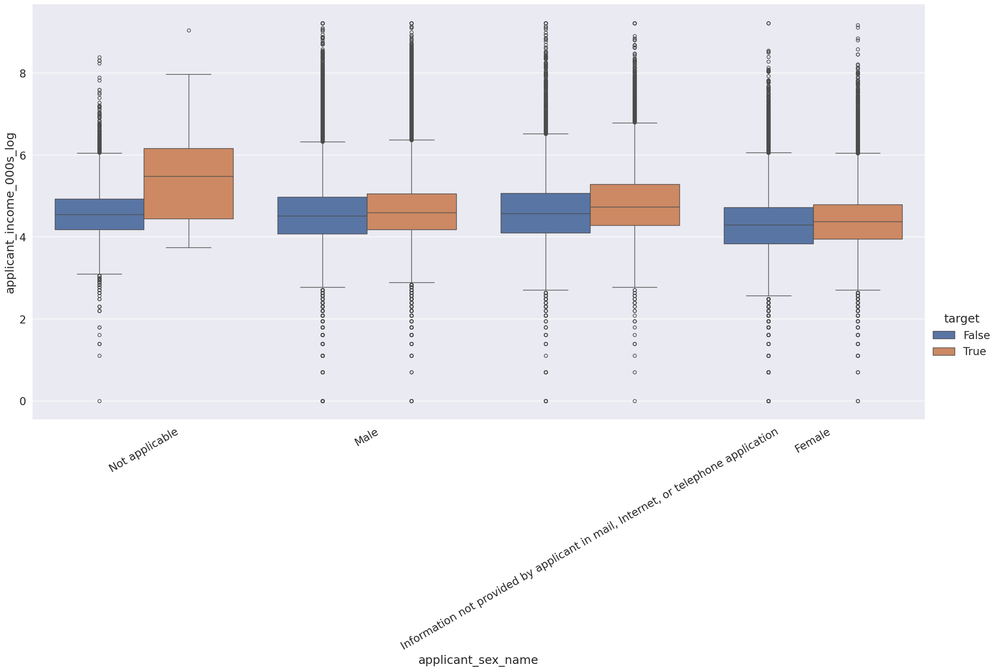

In [19]:
cat_plot = sns.catplot(
    data=df_train,  # таргет
    x='applicant_sex_name',  # ось x
    y='applicant_income_000s_log',  # ось y
    hue='target',  # разделение данных по таргету
    kind='box',  # тип диаграммы
    height=10,  # высота
    aspect=2,  # соотношение сторон каждого графика, так что «аспект * высота» дает ширину
)

cat_plot.tick_params(axis='x', rotation=30)  # поворот подписей на оси x на 30 градусов

### [**Matplotlib**](https://matplotlib.org/stable/gallery/index.html)

In [20]:
import matplotlib.pyplot as plt

%matplotlib inline
# используется для отрисовки в ноутбуке (по дефолту график может открываться в новом окне)

In [21]:
plt.rcParams.update({'font.size': 42})
plt.rc('axes', titlesize=42)

#### [Pie chart](https://matplotlib.org/stable/gallery/pie_and_polar_charts/pie_features.html)

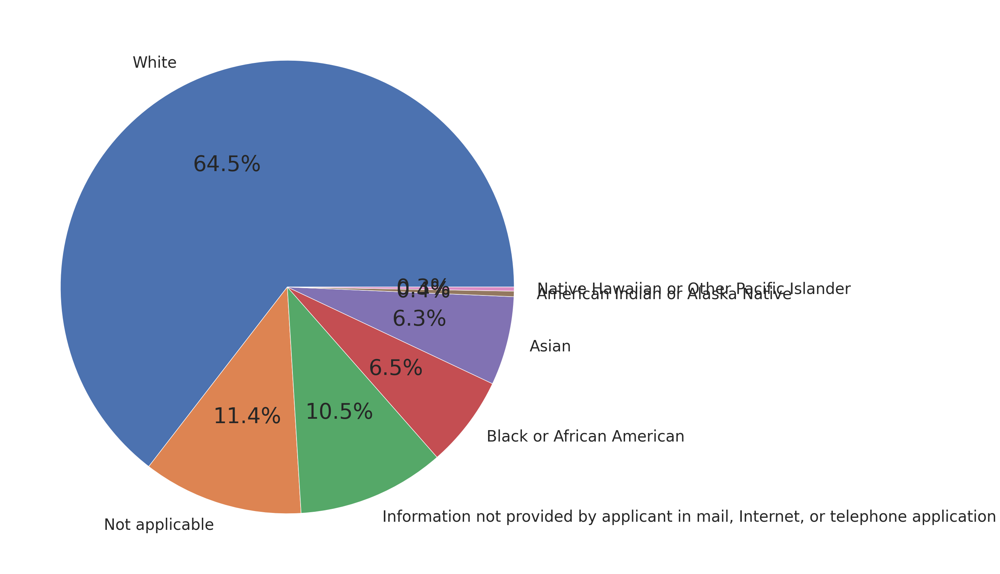

In [22]:
fig, ax = plt.subplots(figsize=(20, 20))  # создание пространства для отрисовки графиков и генерация набора графиков
sizes = df_train.applicant_race_name_1.value_counts()  # частота цветов
patches, texts, autotexts = ax.pie(
    sizes,  # веса
    labels=sizes.index,  # наименования долей
    autopct='%1.1f%%',  # формат вывода долей
)

[ _.set_fontsize(30) for _ in texts ]  # увеличение размера подписей

plt.show()

# Обучение модели
### [**scikit-learn**](https://scikit-learn.org/stable/auto_examples/index.html)
#### [train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html)

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
features = ['applicant_sex', 'applicant_income_000s_log']

In [22]:
df_notna = df_train[[*features, 'target']].copy()
df_notna.head(2)

,applicant_sex,applicant_income_000s_log,target
0,4,NaN,False
1,1,5.4161,False


In [23]:
applicant_income_000s_log_mean = df_notna.applicant_income_000s_log.mean()
applicant_income_000s_log_mean

4.543868351377735

In [24]:
df_notna['applicant_income_000s_log'] = df_notna.applicant_income_000s_log.fillna(applicant_income_000s_log_mean)
df_notna.head(2)

,applicant_sex,applicant_income_000s_log,target
0,4,4.543868,False
1,1,5.416100,False


In [25]:
X = df_notna[features]
y = df_notna.target

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=SEED)

In [27]:
print('Размер тренировочной выборки:', len(X_train))

# при частом определении кол-ва строк в датафрейме эффективнее вычислять длину от индекса
print('Размер тестовой выборки:', len(X_test.index))

Размер тренировочной выборки: 281378
Размер тестовой выборки: 70345


#### [LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

In [28]:
from sklearn.linear_model import LogisticRegression

In [29]:
model = LogisticRegression().fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
y_pred[:10]

array([0.59944115, 0.3651435 , 0.23863373, 0.64103446, 0.47349102,
       0.69313133, 0.63669857, 0.62419653, 0.63148986, 0.4614261 ])

### [ROC AUC](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html)

In [30]:
from sklearn.metrics import auc, roc_auc_score, roc_curve

In [31]:
fpr, tpr, _ = roc_curve(y_test, y_pred)
# False Positive Rate - доля ложно положительных ответов
# True Positive Rate - доля истинно положительных ответов

# закрашенная область
fig = px.area(
    x=fpr,  # значения оси x
    y=tpr,  # значения оси y
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',  # название графика
    labels=dict(x='False Positive Rate', y='True Positive Rate'),  # названия осей
    width=700,  # ширина
    height=500,  # высота
)

# пунктирная линия
fig.add_shape(
    type='line',  # тип объекта
    line=dict(dash='dash'),  # характеристики линии
    x0=0, x1=1, y0=0, y1=1,  # координаты - откуда и куда рисовать
)

# https://plotly.com/python/axes/#fixed-ratio-axes
fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.update_xaxes(constrain='domain')

fig.show()

## Прогноз

In [32]:
df_test = pd.read_csv('test.csv', index_col=0)
df_test.head(2)

C:\Users\Ivans\AppData\Local\Temp\ipykernel_27332\3468546152.py:1: DtypeWarning:

Columns (14,15,16,31,32,33) have mixed types. Specify dtype option on import or set low_memory=False.



,agency_code,agency_abbr,agency_name,applicant_ethnicity,applicant_ethnicity_name,applicant_income_000s,applicant_race_1,applicant_race_2,applicant_race_3,applicant_race_4,...,state_abbr,state_name,hud_median_family_income,loan_amount_000s,number_of_1_to_4_family_units,number_of_owner_occupied_units,minority_population,population,rate_spread,tract_to_msamd_income
0,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,114.0,5,NaN,NaN,NaN,...,NY,New York,69700.0,94,1204.0,1144.0,12.16,3225.0,NaN,96.029999
1,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,108.0,5,NaN,NaN,NaN,...,NY,New York,75200.0,196,1795.0,1348.0,15.16,4862.0,NaN,118.150002


In [33]:
df_test['applicant_income_000s_log'] = np.log(df_test.applicant_income_000s)
df_test['applicant_income_000s_log'] = df_test.applicant_income_000s_log.fillna(applicant_income_000s_log_mean)
df_test.applicant_income_000s_log.head(2)

0    4.736198
1    4.682131
Name: applicant_income_000s_log, dtype: float64

In [34]:
df_test[features].count()

applicant_sex                87931
applicant_income_000s_log    87931
dtype: int64

In [35]:
df_test.shape

(87931, 77)

In [36]:
df_test['target'] = model.predict_proba(df_test[features])[:, 1]
df_test.target.head(2)

0    0.621480
1    0.619542
Name: target, dtype: float64

In [40]:
df_test.target.to_csv('submission.csv')

In [41]:
!zip submission.zip submission.csv

  adding: submission.csv (deflated 74%)
